In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
init_notebook_mode(connected=True)

init_notebook_mode(connected=True)
cf.go_offline()

from plotly.subplots import make_subplots
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

import seaborn as sns




Bad key "text.kerning_factor" on line 4 in
C:\Users\D Pranay kumar naidu\anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


In [3]:
df_confirmed = pd.read_csv('time_series_covid19_confirmed_global.csv')
df_deaths = pd.read_csv('time_series_covid19_deaths_global.csv')
df_recovered = pd.read_csv('time_series_covid19_recovered_global.csv')
df_daily  = pd.read_csv('csse_daily.csv')

In [4]:
df_confirmed.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,32672,32951,33190,33384,33594,33908,34194,34366,34451,34455
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,2819,2893,2964,3038,3106,3188,3278,3371,3454,3571
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,15500,15941,16404,16879,17348,17808,18242,18712,19195,19689
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,855,855,855,855,855,855,855,855,855,858
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,346,346,346,386,386,396,458,462,506,525


In [5]:
df_deaths.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,826,864,898,920,936,957,971,994,1010,1012
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,74,76,79,81,83,83,85,89,93,95
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,946,952,959,968,978,988,996,1004,1011,1018
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,52,52,52,52,52,52,52,52,52,52
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,19,19,19,21,21,22,23,23,26,26


In [6]:
df_confirmed.isnull().sum()


Province/State    185
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
7/9/20              0
7/10/20             0
7/11/20             0
7/12/20             0
7/13/20             0
Length: 178, dtype: int64

In [7]:
df_deaths.isnull().sum()

Province/State    185
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
7/9/20              0
7/10/20             0
7/11/20             0
7/12/20             0
7/13/20             0
Length: 178, dtype: int64

In [8]:
df_deaths.isnull().sum()

Province/State    185
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
7/9/20              0
7/10/20             0
7/11/20             0
7/12/20             0
7/13/20             0
Length: 178, dtype: int64

Lets check all three data sets have same columns

In [9]:
df_confirmed.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '7/4/20', '7/5/20', '7/6/20', '7/7/20', '7/8/20', '7/9/20', '7/10/20',
       '7/11/20', '7/12/20', '7/13/20'],
      dtype='object', length=178)

In [10]:
df_deaths.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '7/4/20', '7/5/20', '7/6/20', '7/7/20', '7/8/20', '7/9/20', '7/10/20',
       '7/11/20', '7/12/20', '7/13/20'],
      dtype='object', length=178)

In [11]:
df_recovered.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '7/4/20', '7/5/20', '7/6/20', '7/7/20', '7/8/20', '7/9/20', '7/10/20',
       '7/11/20', '7/12/20', '7/13/20'],
      dtype='object', length=178)

In [12]:
# converting the dataframe form wide format to long format

df_confirmed_long = df_confirmed.melt(id_vars=["Province/State","Country/Region","Lat","Long"], 
                                      value_vars = df_confirmed.columns[4:],
                                     var_name='Date',value_name='Confirmed')

In [12]:
df_confirmed_long

,Province/State,Country/Region,Lat,Long,Date,Confirmed
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
46279,NaN,Sao Tome and Principe,0.186400,6.613100,7/13/20,732
46280,NaN,Yemen,15.552727,48.516388,7/13/20,1498
46281,NaN,Comoros,-11.645500,43.333300,7/13/20,317
46282,NaN,Tajikistan,38.861000,71.276100,7/13/20,6596


In [13]:
# converting the other data frames into long frmat
df_deaths_long = df_deaths.melt(id_vars=["Province/State","Country/Region","Lat","Long"], 
                                      value_vars = df_deaths.columns[4:],
                                     var_name='Date',value_name='Deaths')

df_recovered_long = df_recovered.melt(id_vars=["Province/State","Country/Region","Lat","Long"], 
                                      value_vars = df_recovered.columns[4:],
                                     var_name='Date',value_name='Recovered')

In [14]:
df_deaths_long

,Province/State,Country/Region,Lat,Long,Date,Deaths
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
46279,NaN,Sao Tome and Principe,0.186400,6.613100,7/13/20,14
46280,NaN,Yemen,15.552727,48.516388,7/13/20,424
46281,NaN,Comoros,-11.645500,43.333300,7/13/20,7
46282,NaN,Tajikistan,38.861000,71.276100,7/13/20,55


In [15]:
df_recovered_long

,Province/State,Country/Region,Lat,Long,Date,Recovered
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
44017,NaN,Sao Tome and Principe,0.186400,6.613100,7/13/20,286
44018,NaN,Yemen,15.552727,48.516388,7/13/20,675
44019,NaN,Comoros,-11.645500,43.333300,7/13/20,296
44020,NaN,Tajikistan,38.861000,71.276100,7/13/20,5278


In [16]:
# merging the three data sets

merged_table = df_confirmed_long.merge(df_deaths_long, how = 'left', 
                                       on = ["Province/State","Country/Region","Lat","Long","Date"])

In [17]:
merged_table = merged_table.merge(df_recovered_long, how = 'left', 
                                  on =["Province/State","Country/Region","Lat","Long","Date"])

In [18]:
merged_table['Date'] = pd.to_datetime(merged_table['Date'])

NOW we have the long timeseries dataset containing the confirmed Deaths Recovered

In [19]:
merged_table.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0.0
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0.0
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0.0
3,NaN,Andorra,42.50630,1.521800,2020-01-22,0,0,0.0
4,NaN,Angola,-11.20270,17.873900,2020-01-22,0,0,0.0


Now lets add the active cases to the merged_table and mortality rate and recovery rate

In [20]:
merged_table['Active'] = merged_table['Confirmed']-merged_table['Deaths']-merged_table['Recovered']

In [21]:
merged_table

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0.0,0.0
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0.0,0.0
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0.0,0.0
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0.0,0.0
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
46279,NaN,Sao Tome and Principe,0.186400,6.613100,2020-07-13,732,14,286.0,432.0
46280,NaN,Yemen,15.552727,48.516388,2020-07-13,1498,424,675.0,399.0
46281,NaN,Comoros,-11.645500,43.333300,2020-07-13,317,7,296.0,14.0
46282,NaN,Tajikistan,38.861000,71.276100,2020-07-13,6596,55,5278.0,1263.0


In [22]:
merged_table.isnull().sum()

Province/State    32190
Country/Region        0
Lat                   0
Long                  0
Date                  0
Confirmed             0
Deaths                0
Recovered          4350
Active             4350
dtype: int64

In [23]:
df_daily.isnull().sum()

FIPS                   682
Admin2                 678
Province_State         169
Country_Region           0
Last_Update              0
Lat                     74
Long_                   74
Confirmed                0
Deaths                   0
Recovered                0
Active                   4
Combined_Key             0
Incidence_Rate          74
Case-Fatality_Ratio     51
dtype: int64

Lets fill the null values with zeros

In [24]:
merged_table.fillna('0')

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
0,0,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0
1,0,Albania,41.153300,20.168300,2020-01-22,0,0,0,0
2,0,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0
3,0,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0
4,0,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0
...,...,...,...,...,...,...,...,...,...
46279,0,Sao Tome and Principe,0.186400,6.613100,2020-07-13,732,14,286,432
46280,0,Yemen,15.552727,48.516388,2020-07-13,1498,424,675,399
46281,0,Comoros,-11.645500,43.333300,2020-07-13,317,7,296,14
46282,0,Tajikistan,38.861000,71.276100,2020-07-13,6596,55,5278,1263


In [25]:
df_daily.fillna('0').head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incidence_Rate,Case-Fatality_Ratio
0,45001,Abbeville,South Carolina,US,2020-07-13 04:43:04,34.2233,-82.4617,153,1,0,152,"Abbeville, South Carolina, US",623.802,0.653595
1,22001,Acadia,Louisiana,US,2020-07-13 04:43:04,30.2951,-92.4142,1339,45,0,1294,"Acadia, Louisiana, US",2158.11,3.36072
2,51001,Accomack,Virginia,US,2020-07-13 04:43:04,37.7671,-75.6323,1042,14,0,1028,"Accomack, Virginia, US",3224.41,1.34357
3,16001,Ada,Idaho,US,2020-07-13 04:43:04,43.4527,-116.242,4146,25,0,4121,"Ada, Idaho, US",860.904,0.602991
4,19001,Adair,Iowa,US,2020-07-13 04:43:04,41.3308,-94.4711,17,0,0,17,"Adair, Iowa, US",237.696,0


Now lets drop the unwanted columns

In [26]:
df_daily.drop(["FIPS", 'Admin2','Last_Update','Combined_Key'],axis = 1, inplace = True)

In [27]:
df_daily.head(10)

,Province_State,Country_Region,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incidence_Rate,Case-Fatality_Ratio
0,South Carolina,US,34.223334,-82.461707,153,1,0,152.0,623.802340,0.653595
1,Louisiana,US,30.295065,-92.414197,1339,45,0,1294.0,2158.111048,3.360717
2,Virginia,US,37.767072,-75.632346,1042,14,0,1028.0,3224.408962,1.343570
3,Idaho,US,43.452658,-116.241552,4146,25,0,4121.0,860.903637,0.602991
4,Iowa,US,41.330756,-94.471059,17,0,0,17.0,237.695749,0.000000
5,Kentucky,US,37.104598,-85.281297,142,19,0,123.0,739.506301,13.380282
6,Missouri,US,40.190586,-92.600782,100,0,0,100.0,394.586276,0.000000
7,Oklahoma,US,35.884942,-94.658593,137,4,0,133.0,617.283951,2.919708
8,Colorado,US,39.874321,-104.336258,4757,158,0,4599.0,919.367401,3.321421
9,Idaho,US,44.893336,-116.454525,12,0,0,12.0,279.459711,0.000000


summing the confirmed, Deaths, Recoverd and Active by country

In [28]:
group_country = df_daily.groupby('Country_Region')['Confirmed', 'Deaths', 'Recovered', 
                                                   'Active'].sum().reset_index()

In [29]:

group_country.style.background_gradient(cmap = 'Reds')

,Country_Region,Confirmed,Deaths,Recovered,Active
0,Afghanistan,34451,1010,21216,12225.000000
1,Albania,3454,93,1946,1415.000000
2,Algeria,19195,1011,13743,4441.000000
3,Andorra,855,52,803,0.000000
4,Angola,506,26,118,362.000000
5,Antigua and Barbuda,74,3,57,14.000000
6,Argentina,100166,1845,42694,55627.000000
7,Armenia,31969,565,19633,11771.000000
8,Australia,9980,108,7769,2103.000000
9,Austria,18897,708,16952,1237.000000


In [30]:
confirmed = group_country[['Country_Region','Confirmed']]

deaths = group_country[['Country_Region','Deaths']]


recovered = group_country[['Country_Region','Recovered']]


active = group_country[['Country_Region', 'Active']]

#cfr = group_country[['Country_Region', 'Case-Fatality_Ratio']]


Number of confirmed, Deaths, Active Cases, Recovered per country

In [31]:
fig1 = px.bar(confirmed.sort_values('Confirmed'),x="Confirmed", y="Country_Region",orientation = 'h',
              color_discrete_sequence=['#B3611A'],text='Confirmed')

fig2 = px.bar(deaths.sort_values('Deaths'),x="Deaths", y="Country_Region",orientation = 'h',
              color_discrete_sequence =['#830707'],text = 'Deaths')



#fig5 = px.bar(cfr.sort_values('Case-Fatality_Ratio'), x = 'Case-Fatality_Ratio',y="Country_Region", orientation = 'h',
              #color_discrete_sequence =['#073707'],text = 'Case-Fatality_Ratio')


fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Totalconfirmed", "Total deaths", "total Recovered", "Total Active"))

fig.add_trace(fig1['data'][0], row=1, col=1)
fig.add_trace(fig2['data'][0], row=1, col=2)
#fig.add_trace(fig3['data'][0], row=2, col=1)
#fig.add_trace(fig4['data'][0], row=2, col=2)
#fig.add_trace(fig5['data'][0], row=3, col=1)

fig.update_layout(height=3000,title = 'country wise')



fig.show()


In [32]:
fig3 = px.bar(recovered.sort_values('Recovered'),x="Recovered", y="Country_Region",orientation = 'h',
              color_discrete_sequence =['#073707'],text = 'Recovered')

fig4 = px.bar(active.sort_values('Active'),x="Active", y="Country_Region",orientation = 'h',
              color_discrete_sequence =['#830707'],text = 'Active')

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("total Recovered", "Total Active"))

fig.add_trace(fig3['data'][0], row=1, col=1)
fig.add_trace(fig4['data'][0], row=1, col=2)

fig.update_layout(height=3000,title = 'country wise')



fig.show()



In [33]:
# converting the 'Date' i.e string Column into Date time object
merged_table['Date'] = pd.to_datetime(merged_table['Date'])

PLotting confirmed, Death, Recovered over time

In [34]:
grp_date = merged_table.groupby(['Date'])['Confirmed','Deaths','Recovered', 'Active'].sum().reset_index()

In [35]:
grp_date.head()

,Date,Confirmed,Deaths,Recovered,Active
0,2020-01-22,555,17,28.0,503.0
1,2020-01-23,654,18,30.0,599.0
2,2020-01-24,941,26,36.0,864.0
3,2020-01-25,1434,42,39.0,1303.0
4,2020-01-26,2118,56,52.0,1899.0


In [36]:
# caluclating the Mortality rate and Recovery rate and their avgs over time

grp_date["Mortality Rate"]=(grp_date["Deaths"]/grp_date["Confirmed"])*100
grp_date["Recovery Rate"]=(grp_date["Recovered"]/grp_date["Confirmed"])*100
grp_date["Closed cases"] = grp_date['Recovered']+grp_date["Deaths"]

In [37]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=grp_date['Date'], y=grp_date['Confirmed'],
                    mode='lines',
                    name='Confirmed'))
fig.add_trace(go.Scatter(x=grp_date['Date'], y=grp_date['Recovered'],
                    mode='lines',
                    name='Recovered',fillcolor = 'green'))
fig.add_trace(go.Scatter(x=grp_date['Date'], y=grp_date['Deaths'],
                    mode='lines',
                    name='Deaths',fillcolor = 'red'))
fig.add_trace(go.Scatter(x=grp_date['Date'], y=grp_date['Active'],
                    mode='lines',
                    name='Active',fillcolor = 'purple'))
fig.add_trace(go.Scatter(x=grp_date['Date'], y=grp_date['Closed cases'],
                    mode='lines',
                    name='closed',fillcolor = 'orange'))
fig.update_layout(title = 'Confirmed vs Deaths vs Recoverd vs Active Vs Closed in world')
fig.show()

In [38]:
# MOrtality Rate
fig_1 = px.line(grp_date, x = 'Date', y = 'Mortality Rate',height = 500,
      title = 'Mortality_rate over time')

fig_1.show()

# Recovery Rate

fig_2 = px.line(grp_date, x = 'Date', y= 'Recovery Rate',height = 500,
               title = 'Recovery_rate')
fig_2.show()


print('Avg mortality rate', grp_date['Mortality Rate'].mean())
print('Avg Recovery rate', grp_date['Recovery Rate'].mean())

Avg mortality rate 4.919274934093349
Avg Recovery rate 32.49689358748399


In [39]:
grp_date1 = merged_table.groupby(['Date','Country/Region'])['Confirmed','Deaths','Recovered', 'Active'].sum().reset_index()

In [40]:
fig_a = px.bar(grp_date1, x = 'Date', y = 'Confirmed', color = 'Country/Region',height = 500,
      title = 'Total Confirmed Cases ')

fig_a.show()






In [41]:
fig_b= px.bar(grp_date1, x = 'Date', y = 'Deaths',color = 'Country/Region',height = 500,
      title = 'Total Deaths')
fig_b.show()

In [42]:
fig_c=px.bar(grp_date1,x='Date',y = 'Recovered', color= 'Country/Region',height = 500,
      title = 'Total Recovered')

fig_c.show()


In [43]:
fig_d=px.bar(grp_date1,x='Date',y = 'Active', color= 'Country/Region',height = 500,
      title = 'Total Active')
fig_d.show()

# log axis

In [44]:
# log axis graphs
fig = px.scatter(grp_date, x='Date', y='Confirmed', title = 'Confirmed (LOG axis)',
                log_x=False ,log_y=True)

fig.show()


In [45]:
fig = px.scatter(grp_date, x='Date', y='Deaths',color = 'Deaths',color_discrete_sequence=['#B3611A'], title = 'Deaths (LOG axis)'
                ,log_x=False ,log_y=True)

fig.show()


In [46]:
fig = px.scatter(grp_date, x='Date', y='Recovered', color = 'Recovered', title = 'Recovered(Log axis)',

                log_x=False ,log_y=True)

fig.show()


# Animation scale of confirmed cases

In [47]:
fig7= px.choropleth(grp_date1, locations="Country/Region", locationmode='country names', color=np.log(grp_date1["Confirmed"]), 
                    hover_name="Country/Region",hover_data = ['Confirmed'] ,animation_frame=grp_date1["Date"].dt.strftime('%Y-%m-%d'),
                    projection = 'natural earth',
                    title='Confirmed Over Time', color_continuous_scale=px.colors.sequential.Reds)
fig7.update(layout_coloraxis_showscale=False)
fig7.show()

# Prediction using Facebook Prophet

In [48]:
pd.set_option('display.float_format', lambda x: '%.f' % x)

In [49]:
per_day = merged_table.groupby(['Date'])['Confirmed','Deaths','Recovered'].sum().reset_index()

In [50]:
per_day.tail()

,Date,Confirmed,Deaths,Recovered
169,2020-07-09,12268518,554924,6645735
170,2020-07-10,12498467,560209,6784677
171,2020-07-11,12717908,565138,6909710
172,2020-07-12,12910357,569128,7021163
173,2020-07-13,13104391,573003,7161007


In [51]:
# letsd do some basic plotting
import fbprophet

from fbprophet import Prophet



In [52]:
m  = Prophet(interval_width=0.95)
m.add_seasonality(name = 'monthly', period = 30.5, fourier_order = 5)

In [53]:
# splitting the data set

confirmed_cases = per_day[['Date','Confirmed']]
Recovered_cases = per_day[['Date', 'Recovered']]
Death_cases = per_day[['Date','Deaths']]


In [54]:
confirmed_cases.rename(columns={'Date':'ds','Confirmed':'y'}, inplace = True)
Recovered_cases.rename(columns={'Date':'ds','Recovered':'y'}, inplace = True)
Death_cases.rename(columns={'Date':'ds','Deaths':'y'}, inplace = True)


In [55]:
confirmed_cases.tail()

,ds,y
169,2020-07-09,12268518
170,2020-07-10,12498467
171,2020-07-11,12717908
172,2020-07-12,12910357
173,2020-07-13,13104391


In [56]:
# splitting into train and test

train = confirmed_cases[:144]


In [57]:
test =  confirmed_cases[144:]

In [58]:
test.tail()

,ds,y
169,2020-07-09,12268518
170,2020-07-10,12498467
171,2020-07-11,12717908
172,2020-07-12,12910357
173,2020-07-13,13104391


In [59]:
m.fit(train)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [60]:
# making the future dates
future_dates = m.make_future_dataframe(periods=30)

In [61]:
future_dates

,ds
0,2020-01-22
1,2020-01-23
2,2020-01-24
3,2020-01-25
4,2020-01-26
...,...
169,2020-07-09
170,2020-07-10
171,2020-07-11
172,2020-07-12


,ds,yhat,yhat_lower,yhat_upper
169,2020-07-09,10561895,9613883,11452108
170,2020-07-10,10692068,9678695,11624075
171,2020-07-11,10818170,9764145,11804588
172,2020-07-12,10936516,9828017,11978839
173,2020-07-13,11049302,9907025,12139490


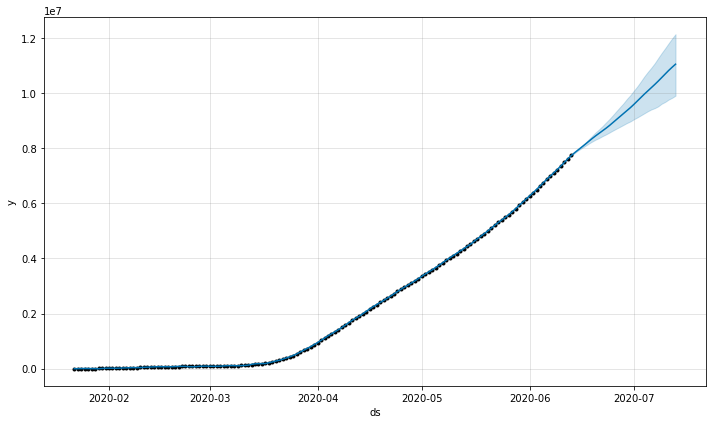

In [62]:
# prediction and plottig 

predicton = m.predict(future_dates)
m.plot(predicton);
predicton[['ds','yhat','yhat_lower','yhat_upper']].tail()

original confirmed_cases = 13104391, predictive_confirmed_cases = 11049302 < c_s < 12189782

In the above graph Dots are the original data and the BLUE line is the predicted data light BLUE is the where the predictions will fall in

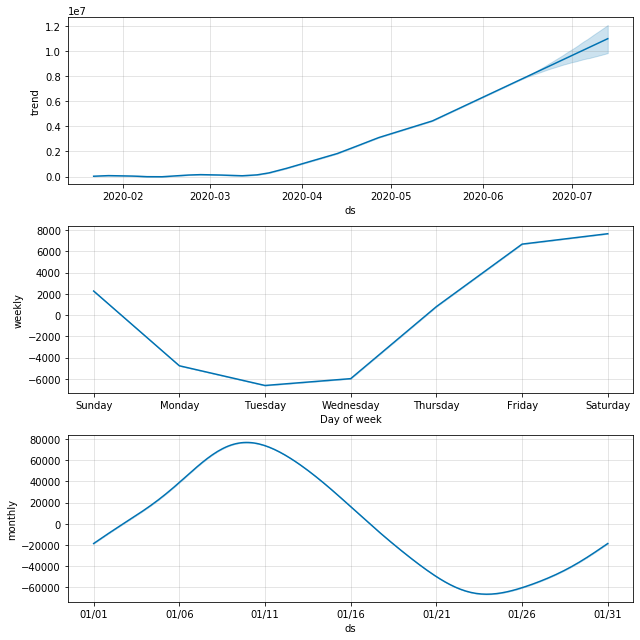

In [63]:
m.plot_components(predicton);

There is huge dip in wednesday in weekly plot  because there is huge dip in the cases in china on this day.

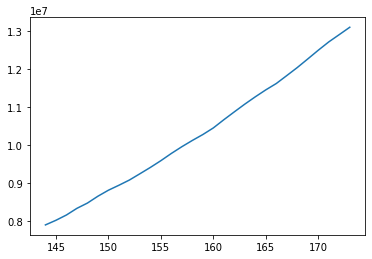

In [64]:
# LETS comapare the test trend with the main plot its increasing as shown in m.plot()
# test plot is plotting after 13-6-2020 and in m.plot(predicton) after blue dots is the prediction, 
#so both plots shows increasing trend

test = test['y']
test.plot()


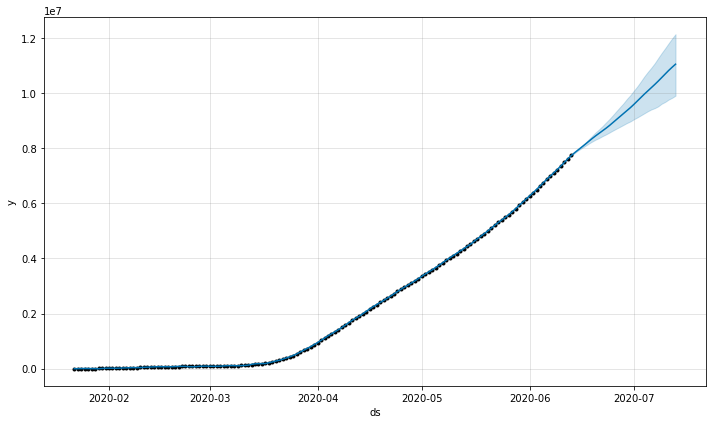

In [65]:
m.plot(predicton);

# Recovered prediction

In [66]:
mm = Prophet(interval_width=0.95)
mm.add_seasonality(name = 'monthly', period = 30.5, fourier_order = 5)

In [67]:
# splitting into train and test

train_re = Recovered_cases[:144]



In [68]:
test_re =  Recovered_cases[144:]

In [69]:
test_re.tail()

,ds,y
169,2020-07-09,6645735
170,2020-07-10,6784677
171,2020-07-11,6909710
172,2020-07-12,7021163
173,2020-07-13,7161007


In [70]:
mm.fit(train_re)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [71]:
future_dates = m.make_future_dataframe(periods=30)

,ds,yhat,yhat_lower,yhat_upper
169,2020-07-09,5394581,4807353,5927310
170,2020-07-10,5481081,4863730,6052966
171,2020-07-11,5561406,4921628,6161314
172,2020-07-12,5633210,4963475,6253694
173,2020-07-13,5708976,5008889,6375935


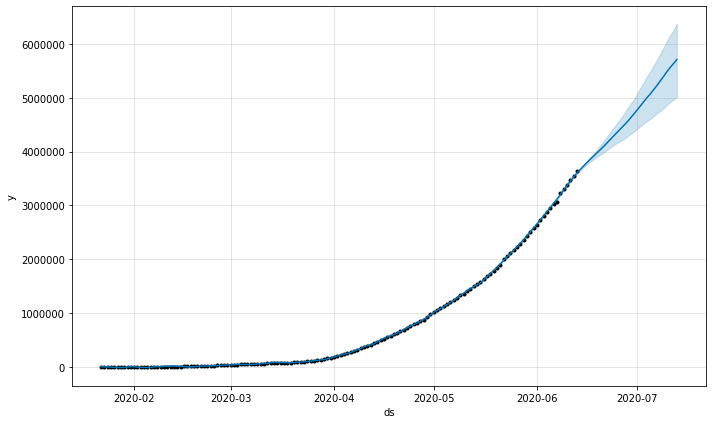

In [72]:
prediction = mm.predict(future_dates)
mm.plot(prediction);
prediction[['ds','yhat','yhat_lower','yhat_upper']].tail()

original recovered cases = 716007,  prediction_recovered_cases = 5708976 < recovered_cases < 6363485

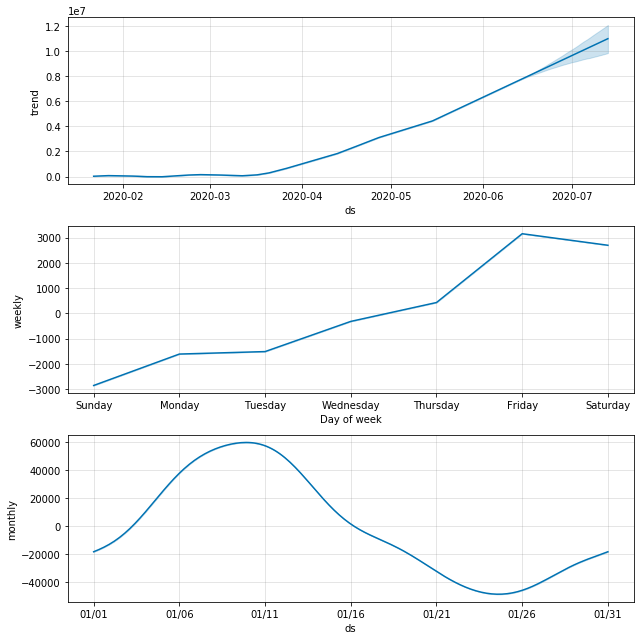

In [73]:
mm.plot_components(predicton);

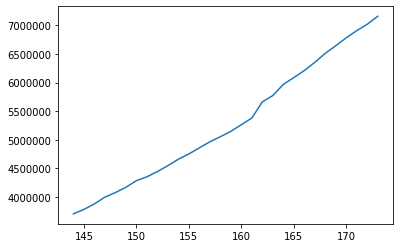

In [74]:
# LETS comapare the test trend with the main plot its increasing as shown in mm.plot()
# test plot(deaths) is plotting after 13-6-2020 and in m.plot(predicton) after blue dots is the prediction, 
#so both plots shows increasing trend

test_re = test_re['y']
test_re.plot()


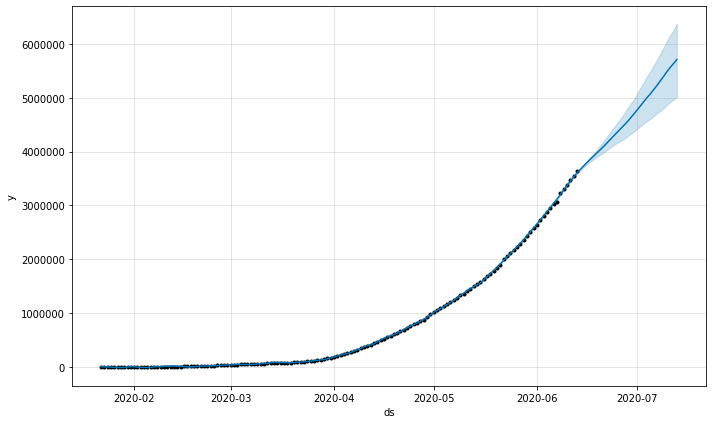

In [75]:
mm.plot(prediction);

# Death Prediction


In [76]:
prh = Prophet(interval_width=0.95)
prh.add_seasonality(name = 'monthly', period = 30.5, fourier_order = 5)

In [77]:
# splitting the data into train and test, test set having 30 days and prediction also doing for 30 days
train_de = Death_cases[:144]

In [78]:
test_de = Death_cases[144:]

In [79]:
test_de.tail()

,ds,y
169,2020-07-09,554924
170,2020-07-10,560209
171,2020-07-11,565138
172,2020-07-12,569128
173,2020-07-13,573003


In [80]:
prh.fit(train_de)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [81]:
future_dates = m.make_future_dataframe(periods=30)

,ds,yhat,yhat_lower,yhat_upper
169,2020-07-09,539990,501856,577626
170,2020-07-10,544801,504663,584312
171,2020-07-11,549066,508245,590854
172,2020-07-12,552429,509754,596100
173,2020-07-13,555907,510751,600560


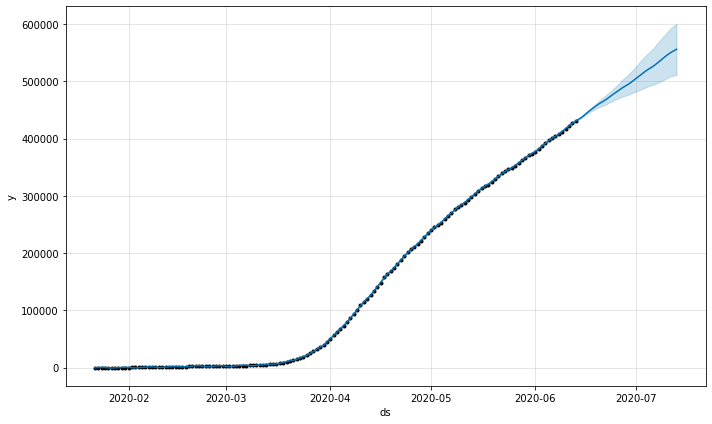

In [82]:
prediction = prh.predict(future_dates)
prh.plot(prediction);
prediction[['ds','yhat','yhat_lower','yhat_upper']].tail()

original Deaths = 573003, predictive_deaths = 555907

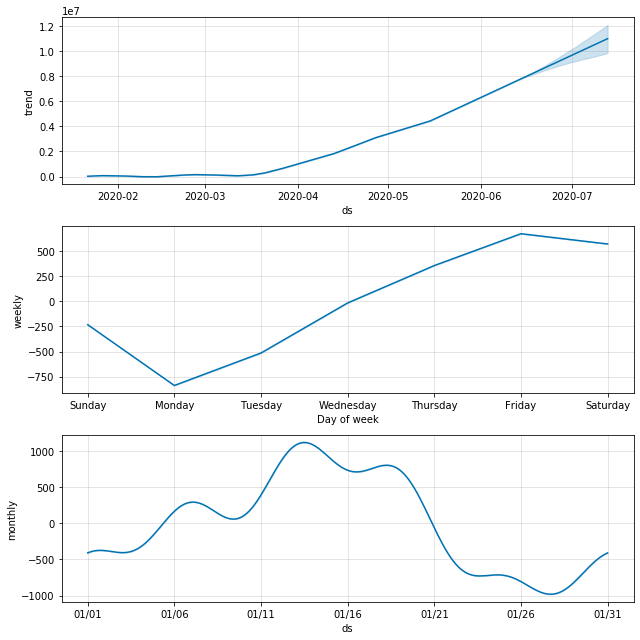

In [83]:
prh.plot_components(predicton);

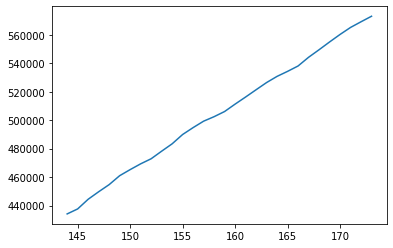

In [84]:
# LETS comapare the test trend with the main plot its increasing as shown in mm.plot()
# test plot(deaths) is plotting after 13-6-2020 and in m.plot(predicton) after blue dots is the prediction, 
#so both plots shows increasing trend

test_de = test_de['y']
test_de.plot()


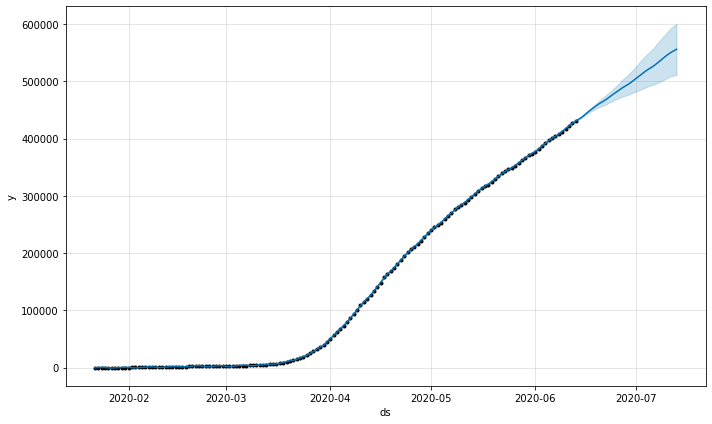

In [85]:
prh.plot(prediction);